<a href="https://colab.research.google.com/github/SushovitNanda/Computer-Vision-Algorithms/blob/main/CV_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Computer Vision Assignment 1

OpenCV is used only for image loading and preprocessing. All algorithms are implemented from scratch in Python.


Image shape: (1280, 914, 3)
Image size: 3509760 pixels
Image data type: uint8


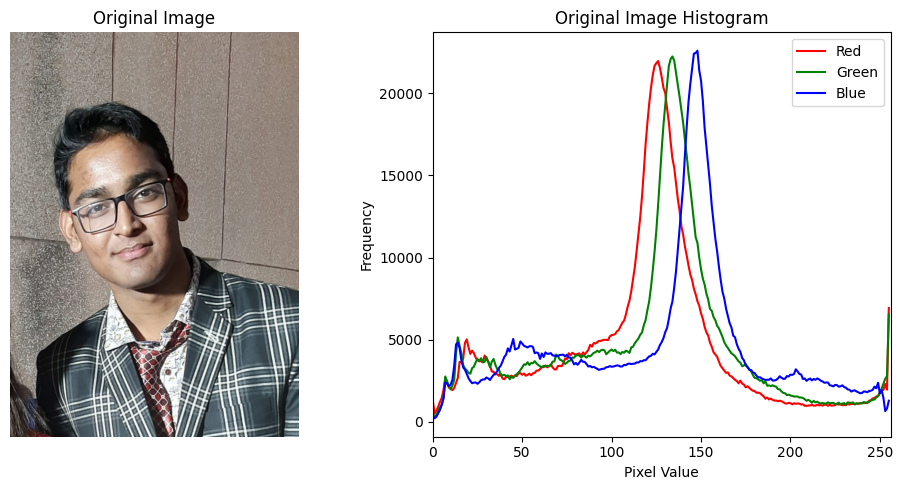

In [ ]:
# Import required libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math

# Load the image
image_path = r"Image.jpg"
original_image = cv2.imread(image_path)

# Print image information
print(f"Image shape: {original_image.shape}")
print(f"Image size: {original_image.size} pixels")
print(f"Image data type: {original_image.dtype}")

# Convert BGR to RGB for display
original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

# Display original image
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_image_rgb)
plt.title('Original Image')
plt.axis('off')

# Compute and display histogram
plt.subplot(1, 2, 2)
colors = ('red', 'green', 'blue')
for i, color in enumerate(colors):
    hist = cv2.calcHist([original_image], [i], None, [256], [0, 256])
    plt.plot(hist, color=color)
plt.title('Original Image Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.xlim([0, 256])
plt.legend(['Red', 'Green', 'Blue'])
plt.tight_layout()
plt.show()

# Q1: RGB to Grayscale Conversion and Channel Analysis**Objective**: Read an RGB image, convert it to grayscale, visualize individual color channels (R, G, B), and compute histograms for each channel.


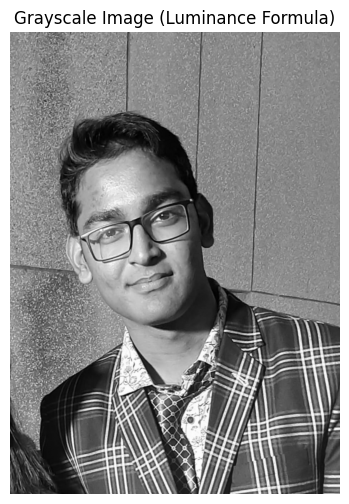

Grayscale image shape: (1280, 914)
Grayscale image range: [0, 255]


In [ ]:
def rgb_to_grayscale(image):
    """
    Convert RGB image to grayscale using the standard luminance formula.

    The luminance formula weights color channels based on human eye sensitivity:
    Y = 0.299×R + 0.587×G + 0.114×B

    Args:
        image: Input RGB image (BGR format from OpenCV)

    Returns:
        grayscale: Grayscale image as uint8 array
    """
    # Luminance weights for BGR format
    weights = np.array([0.114, 0.587, 0.299])  # B, G, R weights

    # Apply luminance formula
    grayscale = np.sum(image * weights, axis=2)

    return grayscale.astype(np.uint8)

# Convert to grayscale
grayscale_image = rgb_to_grayscale(original_image)

# Display grayscale image
plt.figure(figsize=(8, 6))
plt.imshow(grayscale_image, cmap='gray')
plt.title('Grayscale Image (Luminance Formula)')
plt.axis('off')
plt.show()
print(f"Grayscale image shape: {grayscale_image.shape}")
print(f"Grayscale image range: [{grayscale_image.min()}, {grayscale_image.max()}]")

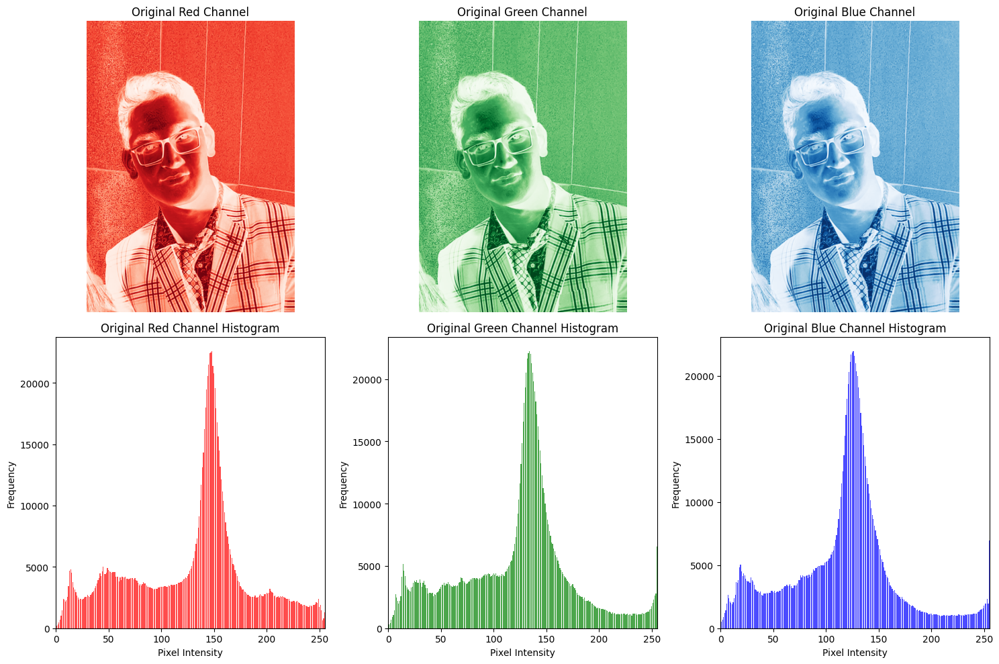

Channel Statistics:
Red channel - Mean: 128.55, Std: 57.12
Green channel - Mean: 122.03, Std: 53.25
Blue channel - Mean: 116.81, Std: 50.92


In [ ]:
def extract_channels(image):
    """
    Extract individual R, G, B channels from a BGR image.

    Args:
        image: Input BGR image

    Returns:
        tuple: (r_channel, g_channel, b_channel) as separate grayscale images
    """
    # OpenCV uses BGR format: [B, G, R]
    b_channel = image[:, :, 0]
    g_channel = image[:, :, 1]
    r_channel = image[:, :, 2]

    return r_channel, g_channel, b_channel

def compute_histogram(channel, bins=256):
    """
    Compute histogram for a grayscale channel.

    Args:
        channel: Input grayscale channel
        bins: Number of histogram bins (default: 256 for 8-bit images)

    Returns:
        histogram: Array of pixel counts for each intensity level
    """
    histogram = np.bincount(channel.flatten(), minlength=bins)
    return histogram

def display_channels_and_histograms(r_channel, g_channel, b_channel, title_prefix=""):
    """
    Display individual color channels and their histograms.

    Args:
        r_channel, g_channel, b_channel: Individual color channels
        title_prefix: Prefix for plot titles
    """
    # Compute histograms
    r_hist = compute_histogram(r_channel)
    g_hist = compute_histogram(g_channel)
    b_hist = compute_histogram(b_channel)

    # Create subplots
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))

    # Channel images
    channels = [r_channel, g_channel, b_channel]
    channel_names = ['Red', 'Green', 'Blue']
    colormaps = ['Reds', 'Greens', 'Blues']
    colors = ['red', 'green', 'blue']

    for i, (channel, name, cmap, color) in enumerate(zip(channels, channel_names, colormaps, colors)):
        # Display channel
        axes[0, i].imshow(channel, cmap=cmap)
        axes[0, i].set_title(f'{title_prefix}{name} Channel')
        axes[0, i].axis('off')

        # Display histogram
        hist = [r_hist, g_hist, b_hist][i]
        axes[1, i].bar(range(256), hist, color=color, alpha=0.7)
        axes[1, i].set_title(f'{title_prefix}{name} Channel Histogram')
        axes[1, i].set_xlim(0, 255)
        axes[1, i].set_xlabel('Pixel Intensity')
        axes[1, i].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()

# Extract channels from original image
r_channel, g_channel, b_channel = extract_channels(original_image)

# Display channels and histograms
display_channels_and_histograms(r_channel, g_channel, b_channel, "Original ")

# Print channel statistics
print("Channel Statistics:")
print(f"Red channel - Mean: {r_channel.mean():.2f}, Std: {r_channel.std():.2f}")
print(f"Green channel - Mean: {g_channel.mean():.2f}, Std: {g_channel.std():.2f}")
print(f"Blue channel - Mean: {b_channel.mean():.2f}, Std: {b_channel.std():.2f}")

# Q2:
# Using OpenCV, read an RGB image, add Gaussian noise to it (e.g., mean = 0,
# variance = 10–20). Then, on the noisy image:
# 1. Convert it to grayscale.
# 2. Visualise the individual colour channels (R, G, B) and the grayscale image.
# 3. Compute and display the histogram for each channel (R, G, B) and for the
# grayscale image. All plots must be clearly labelled.

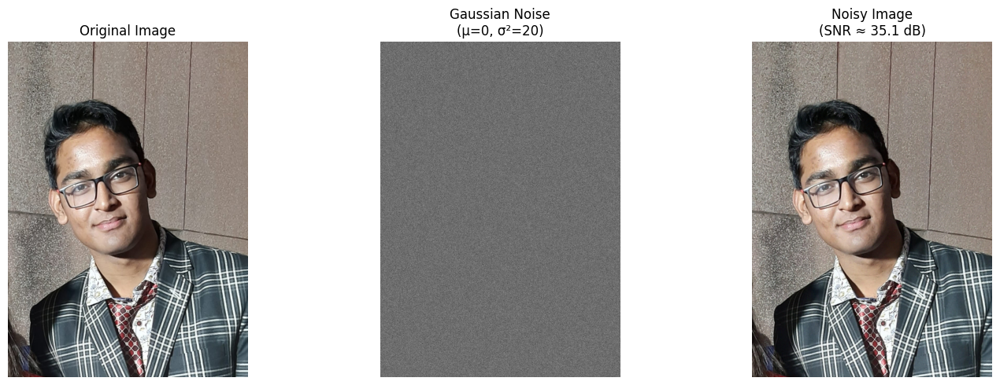

In [ ]:
def add_gaussian_noise(image, mean=0, variance=15):
    """
    Add Gaussian noise to an image.

    Gaussian noise follows the probability density function:
    f(x) = (1/√(2πσ²)) * e^(-(x-μ)²/(2σ²))

    Args:
        image: Input image (BGR format)
        mean: Mean of the Gaussian distribution (default: 0)
        variance: Variance of the Gaussian distribution (default: 15)

    Returns:
        tuple: (noisy_image, noise_array) where noisy_image is clipped to [0,255]
    """
    # Generate Gaussian noise
    std_dev = math.sqrt(variance)
    noise = np.random.normal(mean, std_dev, image.shape)

    # Add noise to image
    noisy_image = image.astype(np.float32) + noise

    # Clip values to valid range [0, 255]
    noisy_image = np.clip(noisy_image, 0, 255)

    return noisy_image.astype(np.uint8), noise

def display_noise_comparison(original_image, noisy_image, noise_array, noise_mean, noise_variance):
    """
    Display original image, noise pattern, and noisy image for comparison.
    """
    # Convert BGR to RGB for display
    original_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
    noisy_rgb = cv2.cvtColor(noisy_image, cv2.COLOR_BGR2RGB)

    # Create subplots
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Display original image
    axes[0].imshow(original_rgb)
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    # Display the noise (normalized for visualization)
    noise_gray = np.mean(noise_array, axis=2)
    noise_normalized = ((noise_gray - noise_gray.min()) /
                       (noise_gray.max() - noise_gray.min()) * 255).astype(np.uint8)
    axes[1].imshow(noise_normalized, cmap='gray')
    axes[1].set_title(f'Gaussian Noise\n(μ={noise_mean}, σ²={noise_variance})')
    axes[1].axis('off')

    # Display noisy image
    axes[2].imshow(noisy_rgb)
    axes[2].set_title(f'Noisy Image\n(SNR ≈ {20*np.log10(255/np.sqrt(noise_variance)):.1f} dB)')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

# Add Gaussian noise with specified parameters
noise_mean = 0
noise_variance = 20  # Using maximum from specified range of 10-20
noisy_image, noise_array = add_gaussian_noise(original_image, noise_mean, noise_variance)

# Display comparison
display_noise_comparison(original_image, noisy_image, noise_array, noise_mean, noise_variance)

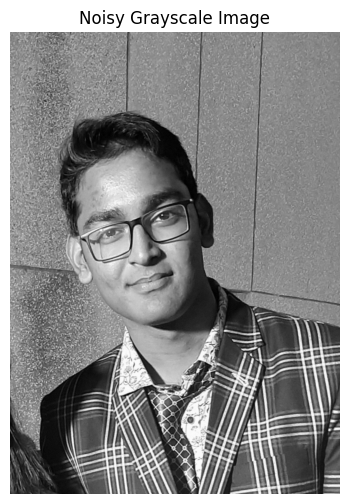

Noisy grayscale image shape: (1280, 914)
Noisy grayscale image range: [0, 255]
Noisy grayscale mean: 122.38, std: 53.75


In [ ]:
# Convert noisy image to grayscale using the same luminance formula
noisy_grayscale = rgb_to_grayscale(noisy_image)

# Display noisy grayscale image
plt.figure(figsize=(8, 6))
plt.imshow(noisy_grayscale, cmap='gray')
plt.title('Noisy Grayscale Image')
plt.axis('off')
plt.show()

print(f"Noisy grayscale image shape: {noisy_grayscale.shape}")
print(f"Noisy grayscale image range: [{noisy_grayscale.min()}, {noisy_grayscale.max()}]")
print(f"Noisy grayscale mean: {noisy_grayscale.mean():.2f}, std: {noisy_grayscale.std():.2f}")

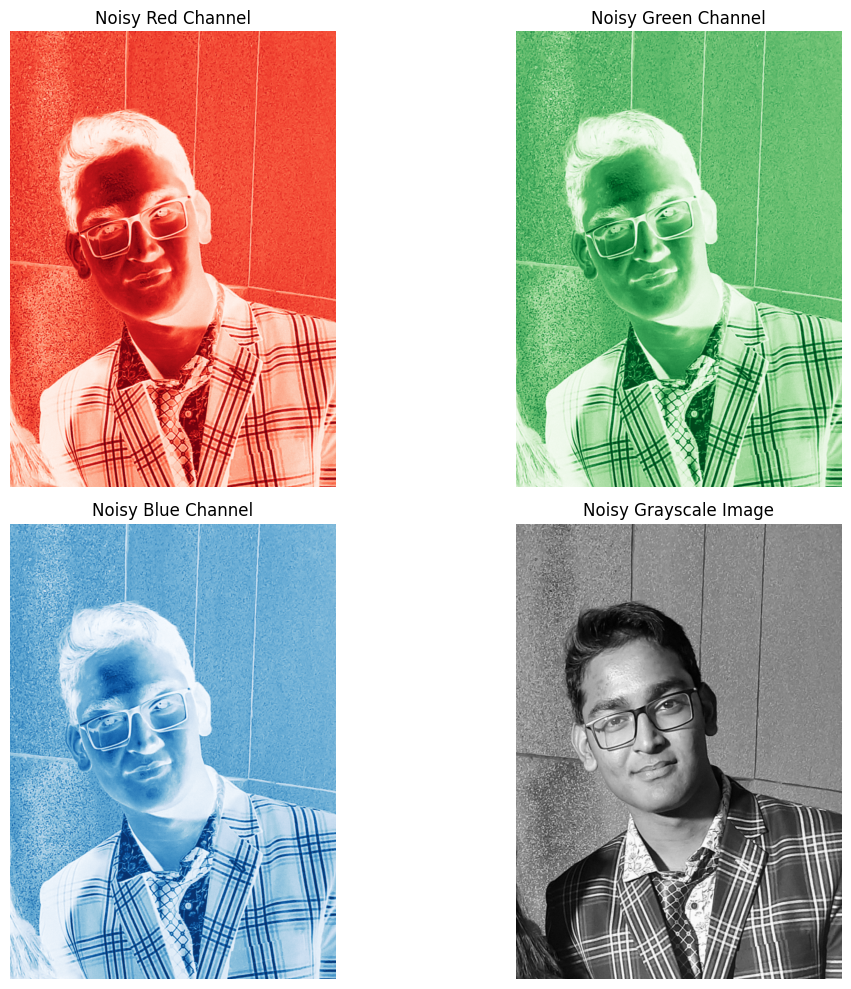

In [ ]:
def display_noisy_channels_and_grayscale(noisy_image, noisy_grayscale):
    """
    Display noisy color channels and grayscale image in a 2x2 grid.
    """
    # Extract channels from noisy image
    noisy_r, noisy_g, noisy_b = extract_channels(noisy_image)

    # Create 2x2 subplot grid
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))

    # Channel images and titles
    channels = [noisy_r, noisy_g, noisy_b, noisy_grayscale]
    titles = ['Noisy Red Channel', 'Noisy Green Channel', 'Noisy Blue Channel', 'Noisy Grayscale Image']
    colormaps = ['Reds', 'Greens', 'Blues', 'gray']
    positions = [(0, 0), (0, 1), (1, 0), (1, 1)]

    for i, (channel, title, cmap, pos) in enumerate(zip(channels, titles, colormaps, positions)):
        axes[pos].imshow(channel, cmap=cmap)
        axes[pos].set_title(title)
        axes[pos].axis('off')

    plt.tight_layout()
    plt.show()

# Display noisy channels and grayscale
display_noisy_channels_and_grayscale(noisy_image, noisy_grayscale)

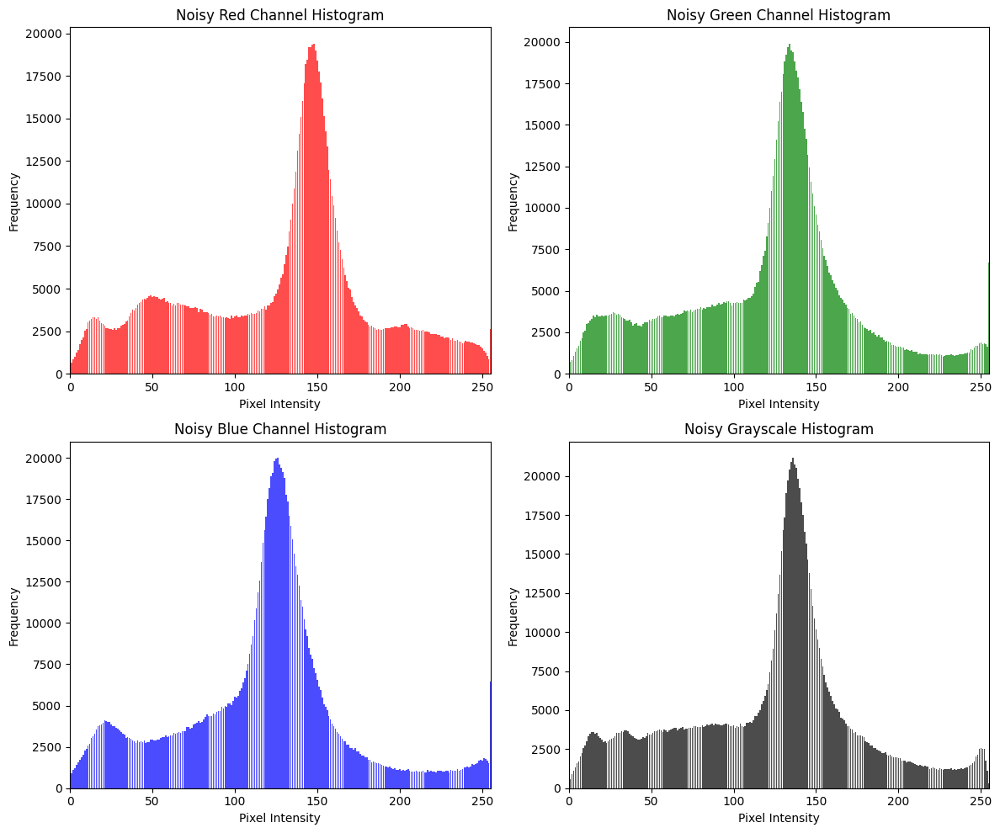

In [ ]:
def display_noisy_histograms(noisy_image, noisy_grayscale):
    """
    Compute and display histograms for noisy image channels and grayscale.
    """
    # Extract channels from noisy image
    noisy_r, noisy_g, noisy_b = extract_channels(noisy_image)

    # Compute histograms
    noisy_r_hist = compute_histogram(noisy_r)
    noisy_g_hist = compute_histogram(noisy_g)
    noisy_b_hist = compute_histogram(noisy_b)
    noisy_gray_hist = compute_histogram(noisy_grayscale)

    # Create 2x2 subplot grid for histograms
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))

    # Histogram data and styling
    histograms = [noisy_r_hist, noisy_g_hist, noisy_b_hist, noisy_gray_hist]
    titles = ['Noisy Red Channel Histogram', 'Noisy Green Channel Histogram',
              'Noisy Blue Channel Histogram', 'Noisy Grayscale Histogram']
    colors = ['red', 'green', 'blue', 'black']
    positions = [(0, 0), (0, 1), (1, 0), (1, 1)]

    for i, (hist, title, color, pos) in enumerate(zip(histograms, titles, colors, positions)):
        axes[pos].bar(range(256), hist, color=color, alpha=0.7)
        axes[pos].set_title(title)
        axes[pos].set_xlim(0, 255)
        axes[pos].set_xlabel('Pixel Intensity')
        axes[pos].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()

# Display histograms for noisy image
display_noisy_histograms(noisy_image, noisy_grayscale)

HISTOGRAM ANALYSIS: CLEAN vs NOISY IMAGES


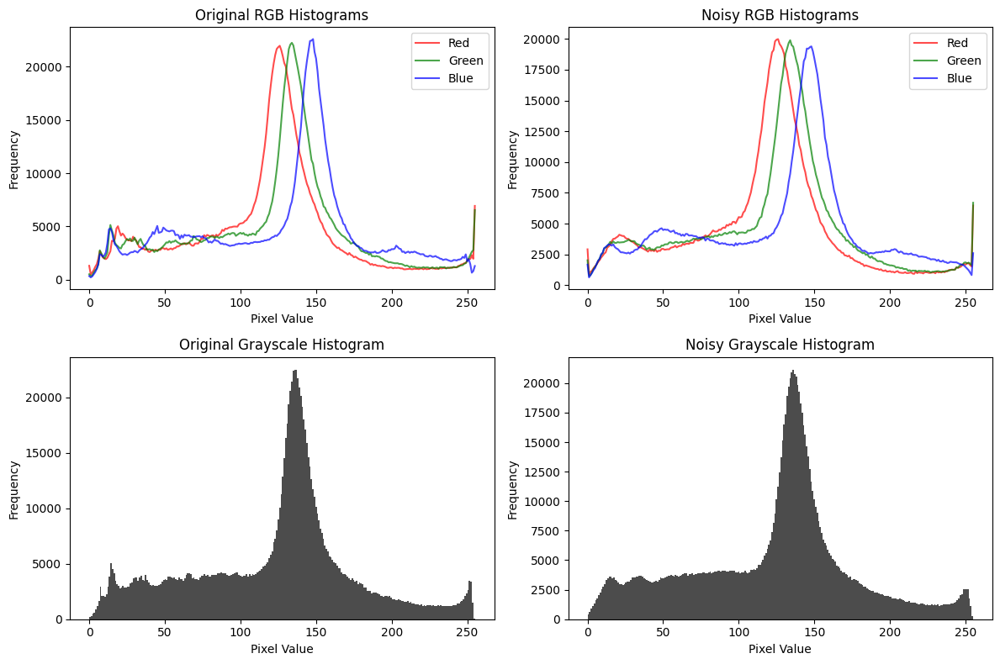

Noise variance: 20
Original grayscale - Mean: 122.84, Std: 53.67
Noisy grayscale - Mean: 122.38, Std: 53.75


In [ ]:
# Histogram Analysis: Clean vs Noisy Images
print("HISTOGRAM ANALYSIS: CLEAN vs NOISY IMAGES")

fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Original RGB histograms
colors = ('red', 'green', 'blue')
for i, color in enumerate(colors):
    hist = cv2.calcHist([original_image], [i], None, [256], [0, 256])
    axes[0, 0].plot(hist, color=color, alpha=0.7)
axes[0, 0].set_title('Original RGB Histograms')
axes[0, 0].set_xlabel('Pixel Value')
axes[0, 0].set_ylabel('Frequency')
axes[0, 0].legend(['Red', 'Green', 'Blue'])

# Noisy RGB histograms
for i, color in enumerate(colors):
    hist = cv2.calcHist([noisy_image], [i], None, [256], [0, 256])
    axes[0, 1].plot(hist, color=color, alpha=0.7)
axes[0, 1].set_title('Noisy RGB Histograms')
axes[0, 1].set_xlabel('Pixel Value')
axes[0, 1].set_ylabel('Frequency')
axes[0, 1].legend(['Red', 'Green', 'Blue'])

# Original grayscale histogram
axes[1, 0].hist(grayscale_image.flatten(), bins=256, color='black', alpha=0.7)
axes[1, 0].set_title('Original Grayscale Histogram')
axes[1, 0].set_xlabel('Pixel Value')
axes[1, 0].set_ylabel('Frequency')

# Noisy grayscale histogram
axes[1, 1].hist(noisy_grayscale.flatten(), bins=256, color='black', alpha=0.7)
axes[1, 1].set_title('Noisy Grayscale Histogram')
axes[1, 1].set_xlabel('Pixel Value')
axes[1, 1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

# Print basic statistics
print(f"Noise variance: {noise_variance}")
print(f"Original grayscale - Mean: {grayscale_image.mean():.2f}, Std: {grayscale_image.std():.2f}")
print(f"Noisy grayscale - Mean: {noisy_grayscale.mean():.2f}, Std: {noisy_grayscale.std():.2f}")

# Q3: Apply three different filters of sizes 3 × 3, 5 × 5, and 7 × 7 on an image with and without Gaussian noise. Perform edge detection using the following methods:
# 1. Sobel edge detector
# 2. Edge detection using the Sobel operator in both horizontal and vertical directions
# 3. Laplacian edge detector
#Compare and describe the differences observed in edge detection results across the filters, kernel sizes, and noise conditions.

In [ ]:
# Edge Detection Functions

def apply_filter(image, kernel):
    """
    Apply a filter to an image using convolution.

    Convolution operation: (f * g)(x,y) = Σ Σ f(m,n) * g(x-m, y-n)

    Args:
        image: Input grayscale image
        kernel: Filter kernel (2D array)

    Returns:
        filtered_image: Filtered image as uint8
    """
    # Get kernel size
    k_h, k_w = kernel.shape
    h, w = image.shape

    # Calculate padding
    pad_h, pad_w = k_h // 2, k_w // 2

    # Pad the image
    padded_image = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')

    # Apply convolution
    filtered = np.zeros_like(image, dtype=np.float32)

    for i in range(h):
        for j in range(w):
            filtered[i, j] = np.sum(padded_image[i:i+k_h, j:j+k_w] * kernel)

    # Normalize to 0-255 range
    filtered = np.clip(filtered, 0, 255)

    return filtered.astype(np.uint8)

def create_average_kernel(size):
    """
    Create an average (box) filter kernel.

    Average filter: K = (1/N²) * ones(N,N)
    Used for noise reduction and smoothing.

    Args:
        size: Kernel size (size x size)

    Returns:
        kernel: Normalized average kernel
    """
    kernel = np.ones((size, size), dtype=np.float32)
    return kernel / (size * size)

def create_sobel_kernels(size):
    """
    Create Sobel kernels of specified size.

    For larger kernels, we use extended Sobel operators that maintain
    the same gradient approximation properties.

    Args:
        size: Kernel size (size x size)

    Returns:
        tuple: (sobel_x, sobel_y) kernels
    """
    if size == 3:
        # Standard 3x3 Sobel kernels
        sobel_x = np.array([[-1, 0, 1],
                            [-2, 0, 2],
                            [-1, 0, 1]], dtype=np.float32)

        sobel_y = np.array([[-1, -2, -1],
                            [0, 0, 0],
                            [1, 2, 1]], dtype=np.float32)

    elif size == 5:
        # Extended 5x5 Sobel kernels
        sobel_x = np.array([[-1, -2, 0, 2, 1],
                            [-4, -8, 0, 8, 4],
                            [-6, -12, 0, 12, 6],
                            [-4, -8, 0, 8, 4],
                            [-1, -2, 0, 2, 1]], dtype=np.float32)

        sobel_y = np.array([[-1, -4, -6, -4, -1],
                            [-2, -8, -12, -8, -2],
                            [0, 0, 0, 0, 0],
                            [2, 8, 12, 8, 2],
                            [1, 4, 6, 4, 1]], dtype=np.float32)

    elif size == 7:
        # Extended 7x7 Sobel kernels
        sobel_x = np.array([[-1, -2, -3, 0, 3, 2, 1],
                            [-4, -8, -12, 0, 12, 8, 4],
                            [-6, -12, -18, 0, 18, 12, 6],
                            [-8, -16, -24, 0, 24, 16, 8],
                            [-6, -12, -18, 0, 18, 12, 6],
                            [-4, -8, -12, 0, 12, 8, 4],
                            [-1, -2, -3, 0, 3, 2, 1]], dtype=np.float32)

        sobel_y = np.array([[-1, -4, -6, -8, -6, -4, -1],
                            [-2, -8, -12, -16, -12, -8, -2],
                            [-3, -12, -18, -24, -18, -12, -3],
                            [0, 0, 0, 0, 0, 0, 0],
                            [3, 12, 18, 24, 18, 12, 3],
                            [2, 8, 12, 16, 12, 8, 2],
                            [1, 4, 6, 8, 6, 4, 1]], dtype=np.float32)

    else:
        raise ValueError(f"Unsupported kernel size: {size}. Supported sizes: 3, 5, 7")

    return sobel_x, sobel_y

def sobel_edge_detector(image, direction='both', kernel_size=3):
    """
    Apply Sobel edge detector with specified kernel size.

    Sobel operators approximate the gradient:
    Gx = horizontal gradient (detects vertical edges)
    Gy = vertical gradient (detects horizontal edges)

    Gradient magnitude: |G| = √(Gx² + Gy²)

    Args:
        image: Input grayscale image
        direction: 'x', 'y', or 'both'
        kernel_size: Size of Sobel kernel (3, 5, or 7)

    Returns:
        edges: Edge-detected image
    """
    # Create Sobel kernels of specified size
    sobel_x, sobel_y = create_sobel_kernels(kernel_size)

    if direction == 'x':
        return apply_filter(image, sobel_x)
    elif direction == 'y':
        return apply_filter(image, sobel_y)
    else:  # both directions
        edges_x = apply_filter(image, sobel_x)
        edges_y = apply_filter(image, sobel_y)

        # Compute gradient magnitude
        edges = np.sqrt(edges_x.astype(np.float32)**2 + edges_y.astype(np.float32)**2)
        edges = np.clip(edges, 0, 255)

        return edges.astype(np.uint8)

def create_laplacian_kernel(size):
    """
    Create Laplacian kernel of specified size.

    The Laplacian operator approximates the second derivative:
    ∇²f = ∂²f/∂x² + ∂²f/∂y²

    For larger kernels, we use extended Laplacian operators.

    Args:
        size: Kernel size (size x size)

    Returns:
        kernel: Laplacian kernel
    """
    if size == 3:
        # Standard 3x3 Laplacian kernel (4-connected)
        kernel = np.array([[0, 1, 0],
                           [1, -4, 1],
                           [0, 1, 0]], dtype=np.float32)

    elif size == 5:
        # Extended 5x5 Laplacian kernel
        kernel = np.array([[0, 0, 1, 0, 0],
                           [0, 1, 2, 1, 0],
                           [1, 2, -16, 2, 1],
                           [0, 1, 2, 1, 0],
                           [0, 0, 1, 0, 0]], dtype=np.float32)

    elif size == 7:
        # Extended 7x7 Laplacian kernel
        kernel = np.array([[0, 0, 0, 1, 0, 0, 0],
                           [0, 0, 1, 2, 1, 0, 0],
                           [0, 1, 2, 3, 2, 1, 0],
                           [1, 2, 3, -44, 3, 2, 1],
                           [0, 1, 2, 3, 2, 1, 0],
                           [0, 0, 1, 2, 1, 0, 0],
                           [0, 0, 0, 1, 0, 0, 0]], dtype=np.float32)


    return kernel

def laplacian_edge_detector(image, kernel_size=3):
    """
    Apply Laplacian edge detector with specified kernel size.

    Laplacian operator: ∇²f = ∂²f/∂x² + ∂²f/∂y²
    Detects edges by finding zero-crossings in the second derivative.

    Args:
        image: Input grayscale image
        kernel_size: Size of Laplacian kernel (3, 5, or 7)

    Returns:
        edges: Edge-detected image
    """
    # Create Laplacian kernel of specified size
    laplacian_kernel = create_laplacian_kernel(kernel_size)

    # Apply the filter without clipping to preserve negative values
    filtered = apply_filter(image, laplacian_kernel)

    # Convert to absolute values and normalize to 0-255 range for visualization
    # This makes both positive and negative edges visible
    abs_filtered = np.abs(filtered.astype(np.float32))

    # Normalize to 0-255 range
    if abs_filtered.max() > 0:
        normalized = (abs_filtered / abs_filtered.max() * 255).astype(np.uint8)
    else:
        normalized = abs_filtered.astype(np.uint8)

    return normalized

# Edge Detection Parameters
filter_sizes = [3, 5, 7]
images = [grayscale_image, noisy_grayscale]
image_names = ['Clean', 'Noisy']

print("Edge Detection Setup:")
print(f"Filter sizes: {filter_sizes}")
print(f"Images: {image_names}")

Edge Detection Setup:
Filter sizes: [3, 5, 7]
Images: ['Clean', 'Noisy']


1. Sobel Edge Detector Results (Combined X+Y):


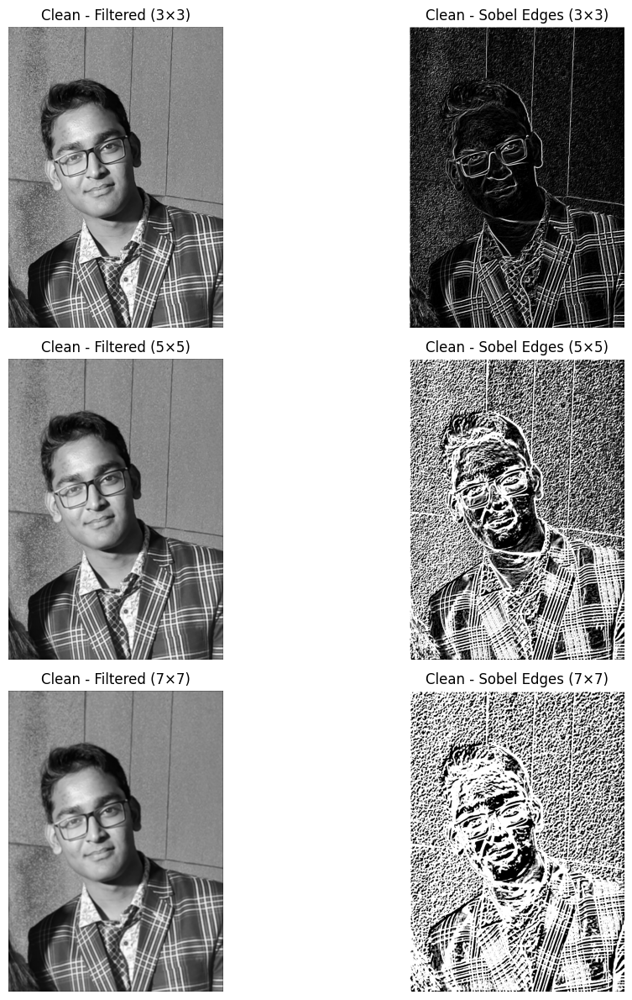

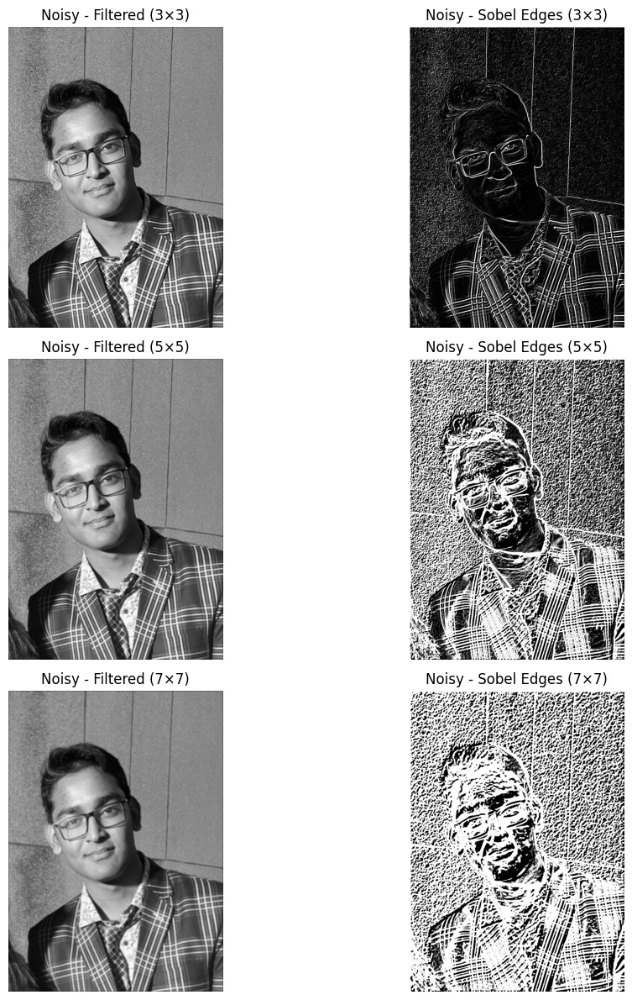

In [ ]:
# 1. Sobel Edge Detector (Combined)
print("1. Sobel Edge Detector Results (Combined X+Y):")

for img, name in zip(images, image_names):
    fig, axes = plt.subplots(len(filter_sizes), 2, figsize=(12, 4*len(filter_sizes)))

    # Ensure axes is 2D
    if len(filter_sizes) == 1:
        axes = axes.reshape(1, -1)

    for i, size in enumerate(filter_sizes):
        # Create and apply average filter
        kernel = create_average_kernel(size)
        filtered = apply_filter(img, kernel)

        # Apply Sobel edge detector (combined) with matching kernel size
        sobel_edges = sobel_edge_detector(filtered, 'both', size)

        # Display results
        axes[i, 0].imshow(filtered, cmap='gray', vmin=0, vmax=255)
        axes[i, 0].set_title(f'{name} - Filtered ({size}×{size})')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(sobel_edges, cmap='gray', vmin=0, vmax=255)
        axes[i, 1].set_title(f'{name} - Sobel Edges ({size}×{size})')
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

2. Sobel Operator in Horizontal and Vertical Directions:


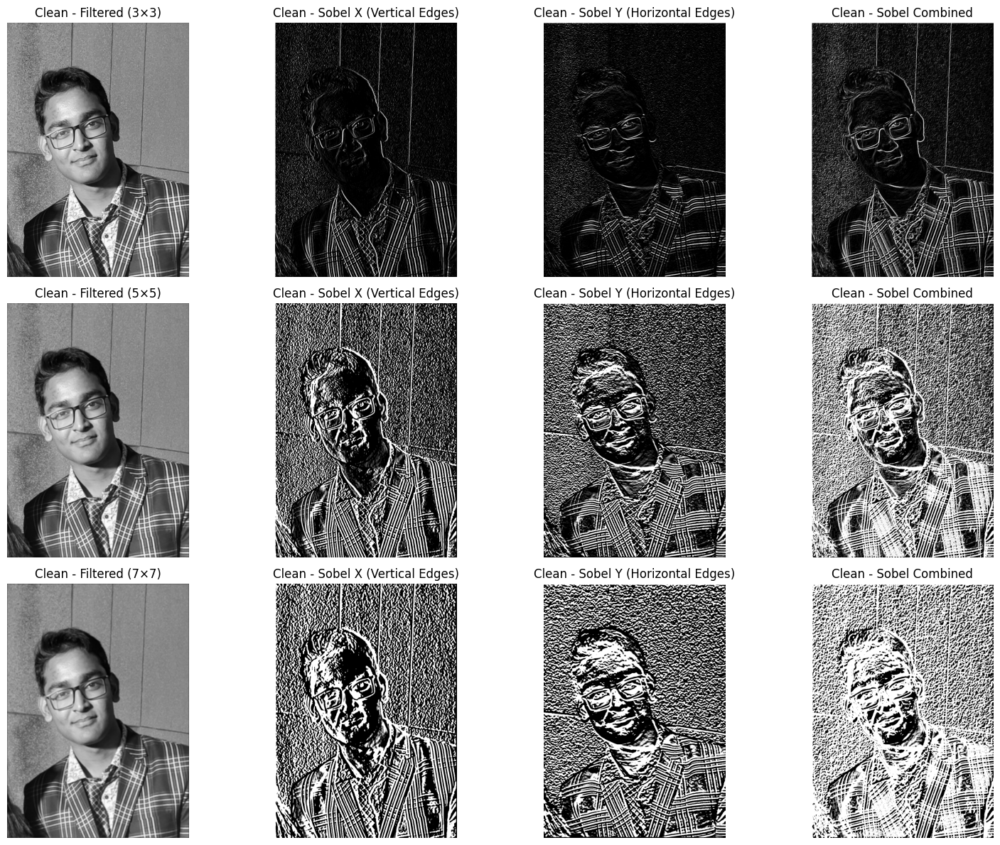

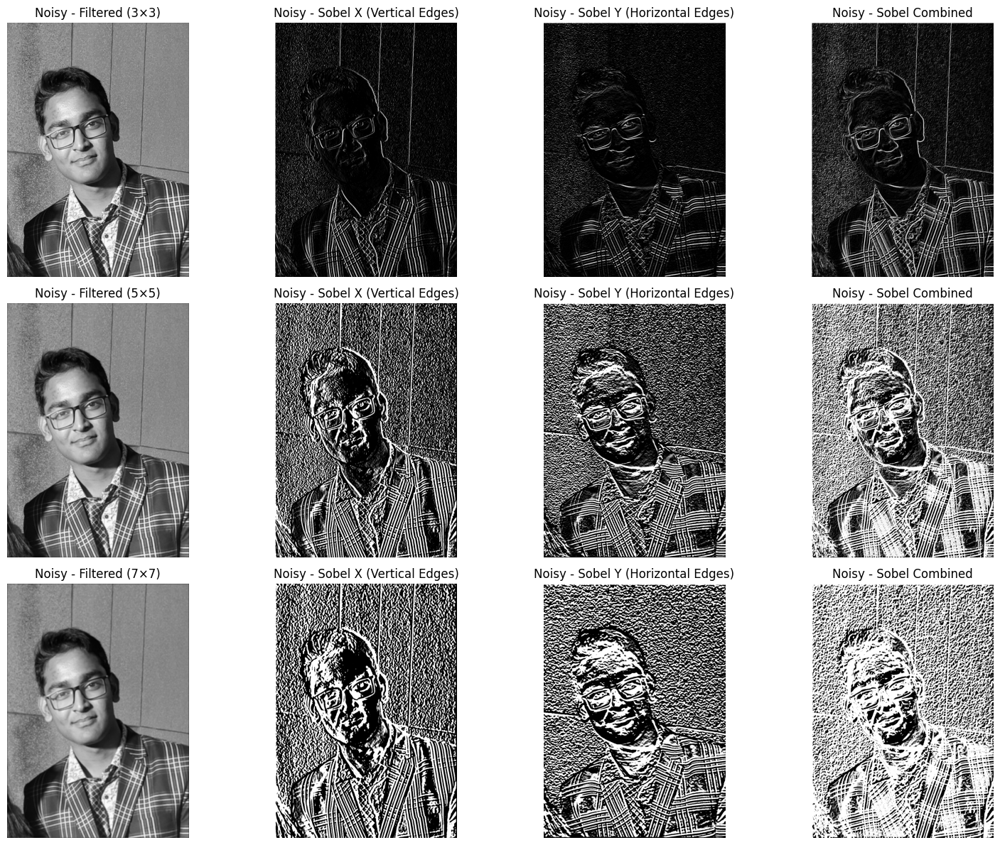

In [ ]:
# 2. Sobel Operator in Horizontal and Vertical Directions
print("2. Sobel Operator in Horizontal and Vertical Directions:")

for img, name in zip(images, image_names):
    fig, axes = plt.subplots(len(filter_sizes), 4, figsize=(16, 4*len(filter_sizes)))

    # Ensure axes is 2D
    if len(filter_sizes) == 1:
        axes = axes.reshape(1, -1)

    for i, size in enumerate(filter_sizes):
        # Create and apply average filter
        kernel = create_average_kernel(size)
        filtered = apply_filter(img, kernel)

        # Apply Sobel in different directions with matching kernel size
        sobel_x = sobel_edge_detector(filtered, 'x', size)  # Vertical edges
        sobel_y = sobel_edge_detector(filtered, 'y', size)  # Horizontal edges
        sobel_both = sobel_edge_detector(filtered, 'both', size)  # Combined

        # Display results
        axes[i, 0].imshow(filtered, cmap='gray', vmin=0, vmax=255)
        axes[i, 0].set_title(f'{name} - Filtered ({size}×{size})')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(sobel_x, cmap='gray', vmin=0, vmax=255)
        axes[i, 1].set_title(f'{name} - Sobel X (Vertical Edges)')
        axes[i, 1].axis('off')

        axes[i, 2].imshow(sobel_y, cmap='gray', vmin=0, vmax=255)
        axes[i, 2].set_title(f'{name} - Sobel Y (Horizontal Edges)')
        axes[i, 2].axis('off')

        axes[i, 3].imshow(sobel_both, cmap='gray', vmin=0, vmax=255)
        axes[i, 3].set_title(f'{name} - Sobel Combined')
        axes[i, 3].axis('off')

    plt.tight_layout()
    plt.show()

3. Laplacian Edge Detector Results:


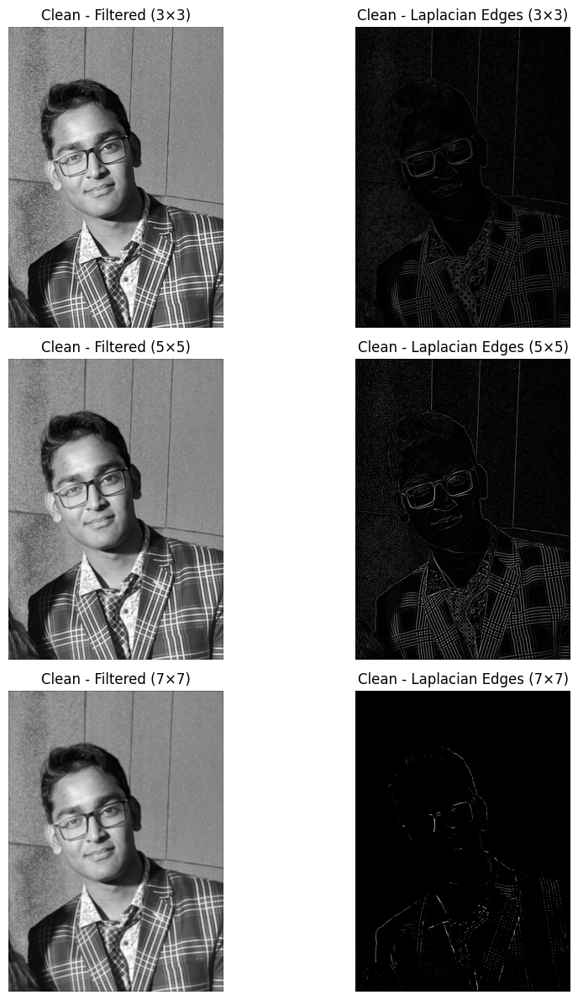

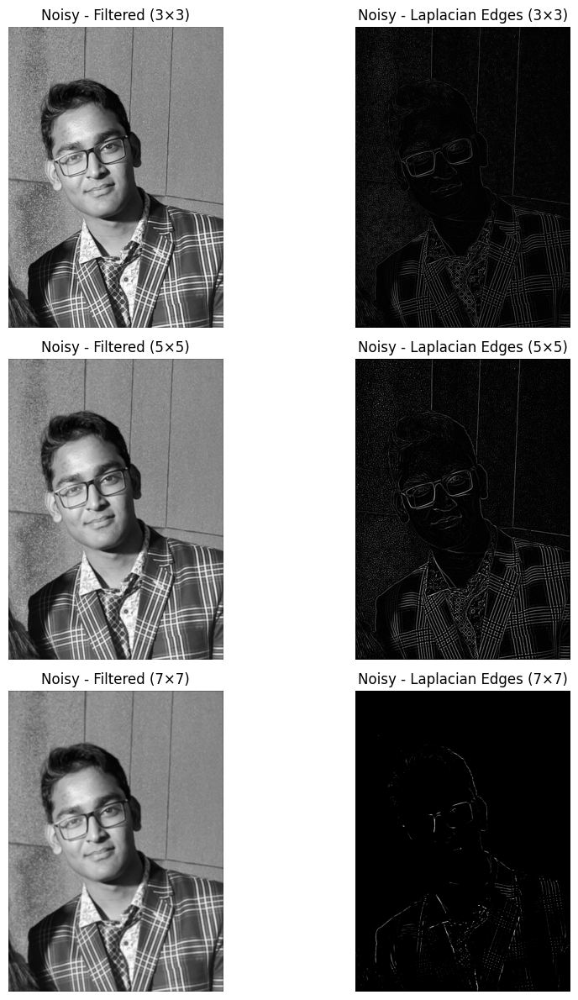

In [ ]:
# 3. Laplacian Edge Detector
print("3. Laplacian Edge Detector Results:")

for img, name in zip(images, image_names):
    fig, axes = plt.subplots(len(filter_sizes), 2, figsize=(10, 4*len(filter_sizes)))

    # Ensure axes is 2D
    if len(filter_sizes) == 1:
        axes = axes.reshape(1, -1)

    for i, size in enumerate(filter_sizes):
        # Create and apply average filter
        kernel = create_average_kernel(size)
        filtered = apply_filter(img, kernel)

        # Apply Laplacian edge detector with matching kernel size
        laplacian_edges = laplacian_edge_detector(filtered, size)

        # Display results
        axes[i, 0].imshow(filtered, cmap='gray', vmin=0, vmax=255)
        axes[i, 0].set_title(f'{name} - Filtered ({size}×{size})')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(laplacian_edges, cmap='gray', vmin=0, vmax=255)
        axes[i, 1].set_title(f'{name} - Laplacian Edges ({size}×{size})')
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

# Q4: Implement the Canny edge detector from scratch by following these steps:
# 1. Apply Gaussian smoothing.
# 2. Compute gradient magnitude and orientation using Sobel filters.
# 3. Apply non-maximum suppression.
# 4. Apply hysteresis thresholding (use two thresholds).
# Apply your implementation to both a clean image and a noisy image. Show how  noise affects the results.

In [ ]:
# Canny Edge Detector Implementation from Scratch

def create_gaussian_kernel(size, sigma=1):
    """
    Create a 2D Gaussian kernel.

    Gaussian function: G(x,y) = (1/(2πσ²)) * e^(-(x²+y²)/(2σ²))

    Args:
        size: Kernel size (size x size)
        sigma: Standard deviation of Gaussian

    Returns:
        kernel: Normalized Gaussian kernel
    """
    kernel = np.zeros((size, size))
    center = size // 2

    for i in range(size):
        for j in range(size):
            x, y = i - center, j - center
            # Gaussian formula
            kernel[i, j] = (1 / (2 * math.pi * sigma**2)) * math.exp(-(x**2 + y**2) / (2 * sigma**2))

    # Normalize kernel to sum to 1
    return kernel / np.sum(kernel)

def gaussian_smooth(image, kernel_size=5, sigma=1):
    """
    Apply Gaussian smoothing to reduce noise.

    Args:
        image: Input grayscale image
        kernel_size: Size of Gaussian kernel
        sigma: Standard deviation of Gaussian

    Returns:
        smoothed: Gaussian-smoothed image
    """
    kernel = create_gaussian_kernel(kernel_size, sigma)
    smoothed = apply_filter(image, kernel)
    return smoothed.astype(np.float32)

def compute_gradients(image, kernel_size=3):
    """
    Compute gradient magnitude and orientation using Sobel filters.

    Sobel operators:
    Gx = horizontal gradient (detects vertical edges)
    Gy = vertical gradient (detects horizontal edges)

    Gradient magnitude: |G| = √(Gx² + Gy²)
    Gradient orientation: θ = arctan(Gy/Gx)

    Args:
        image: Input grayscale image
        kernel_size: Size of Sobel kernel (3, 5, or 7)

    Returns:
        tuple: (grad_x, grad_y, magnitude, orientation)
    """
    # Create Sobel kernels of specified size
    sobel_x, sobel_y = create_sobel_kernels(kernel_size)

    # Compute gradients
    grad_x = apply_filter(image, sobel_x)
    grad_y = apply_filter(image, sobel_y)

    # Compute gradient magnitude and orientation
    magnitude = np.sqrt(grad_x.astype(np.float32)**2 + grad_y.astype(np.float32)**2)
    orientation = np.arctan2(grad_y.astype(np.float32), grad_x.astype(np.float32)) * (180 / np.pi)

    # Convert orientation to range [0, 180) for easier processing
    orientation[orientation < 0] += 180

    return grad_x, grad_y, magnitude, orientation

def non_maximum_suppression(magnitude, orientation):
    """
    Apply non-maximum suppression to thin edges.

    For each pixel, compare its gradient magnitude with its neighbors
    along the gradient direction. Keep only local maxima.

    Args:
        magnitude: Gradient magnitude image
        orientation: Gradient orientation image (in degrees)

    Returns:
        suppressed: Thinned edge image
    """
    suppressed = np.zeros_like(magnitude)
    h, w = magnitude.shape

    for i in range(1, h-1):
        for j in range(1, w-1):
            angle = orientation[i, j]

            # Determine neighbors based on gradient direction
            if (0 <= angle < 22.5) or (157.5 <= angle <= 180):
                neighbors = [magnitude[i, j-1], magnitude[i, j+1]]
            elif 22.5 <= angle < 67.5:
                neighbors = [magnitude[i-1, j-1], magnitude[i+1, j+1]]
            elif 67.5 <= angle < 112.5:
                neighbors = [magnitude[i-1, j], magnitude[i+1, j]]
            else:  # 112.5 <= angle < 157.5
                neighbors = [magnitude[i-1, j+1], magnitude[i+1, j-1]]

            # Keep pixel if it's a local maximum
            if magnitude[i, j] >= max(neighbors):
                suppressed[i, j] = magnitude[i, j]

    return suppressed

def hysteresis_thresholding(image, low_threshold_ratio=0.05, high_threshold_ratio=0.15):
    """
    Apply hysteresis thresholding to connect weak edges to strong edges.

    Uses two thresholds:
    - High threshold: Strong edges (definitely edges)
    - Low threshold: Weak edges (potential edges)

    Weak edges are kept only if they're connected to strong edges.

    Args:
        image: Input edge image after non-maximum suppression
        low_threshold_ratio: Ratio for low threshold (relative to max)
        high_threshold_ratio: Ratio for high threshold (relative to max)

    Returns:
        result: Final binary edge image
    """
    # Calculate thresholds
    high_threshold = np.max(image) * high_threshold_ratio
    low_threshold = high_threshold * low_threshold_ratio

    print(f"Threshold values - Low: {low_threshold:.2f}, High: {high_threshold:.2f}")

    # Classify pixels
    strong_edges = (image >= high_threshold)
    weak_edges = (image >= low_threshold) & (image < high_threshold)

    # Initialize result
    result = np.zeros_like(image, dtype=np.uint8)
    result[strong_edges] = 255

    # Connect weak edges to strong edges using 8-connectivity
    h, w = image.shape
    for i in range(1, h-1):
        for j in range(1, w-1):
            if weak_edges[i, j]:
                # Check 8-neighbors
                neighbors = [
                    result[i-1, j-1], result[i-1, j], result[i-1, j+1],
                    result[i, j-1],                   result[i, j+1],
                    result[i+1, j-1], result[i+1, j], result[i+1, j+1]
                ]
                if any(neighbor == 255 for neighbor in neighbors):
                    result[i, j] = 255

    return result

def canny_edge_detector(image, kernel_size=5, sigma=1.4, low_threshold_ratio=0.05, high_threshold_ratio=0.15):
    """
    Complete Canny edge detector implementation.

    Algorithm steps:
    1. Gaussian smoothing to reduce noise
    2. Compute gradient magnitude and orientation using Sobel
    3. Apply non-maximum suppression to thin edges
    4. Apply hysteresis thresholding to connect edges

    Args:
        image: Input grayscale image
        kernel_size: Size of Gaussian kernel
        sigma: Standard deviation of Gaussian
        low_threshold_ratio: Low threshold ratio
        high_threshold_ratio: High threshold ratio

    Returns:
        tuple: (edges, smoothed, magnitude, suppressed)
    """
    # Step 1: Gaussian smoothing
    smoothed = gaussian_smooth(image, kernel_size, sigma)
    # Step 2: Compute gradients
    _, _, magnitude, orientation = compute_gradients(smoothed, kernel_size)
    # Step 3: Non-maximum suppression
    suppressed = non_maximum_suppression(magnitude, orientation)
    # Step 4: Hysteresis thresholding
    edges = hysteresis_thresholding(suppressed, low_threshold_ratio, high_threshold_ratio)
    return edges, smoothed, magnitude, suppressed

# Parameters
kernel_size = 5
sigma = 1.4
low_threshold_ratio = 0.05
high_threshold_ratio = 0.15

print("CANNY EDGE DETECTOR IMPLEMENTATION")

# Apply Canny edge detector to clean image
canny_clean, smoothed_clean, magnitude_clean, suppressed_clean = canny_edge_detector(
    grayscale_image, kernel_size, sigma, low_threshold_ratio, high_threshold_ratio)

# Apply Canny edge detector to noisy image
canny_noisy, smoothed_noisy, magnitude_noisy, suppressed_noisy = canny_edge_detector(
    noisy_grayscale, kernel_size, sigma, low_threshold_ratio, high_threshold_ratio)

CANNY EDGE DETECTOR IMPLEMENTATION
Threshold values - Low: 2.70, High: 54.09
Threshold values - Low: 2.70, High: 54.09


In [ ]:
# Modified Canny Edge Detector to return hysteresis thresholding output
def canny_edge_detector_with_steps(image, kernel_size=5, sigma=1.4, low_threshold_ratio=0.05, high_threshold_ratio=0.15):
    """
    Complete Canny edge detector implementation with all intermediate steps.

    Returns:
        tuple: (edges, smoothed, magnitude, suppressed, hysteresis_output)
    """
    # Step 1: Gaussian smoothing
    smoothed = gaussian_smooth(image, kernel_size, sigma)
    # Step 2: Compute gradients
    _, _, magnitude, orientation = compute_gradients(smoothed, kernel_size)
    # Step 3: Non-maximum suppression
    suppressed = non_maximum_suppression(magnitude, orientation)
    # Step 4: Hysteresis thresholding
    edges = hysteresis_thresholding(suppressed, low_threshold_ratio, high_threshold_ratio)
    return edges, smoothed, magnitude, suppressed, edges  # edges is the hysteresis output

# Modified display function to show hysteresis thresholding step
def display_canny_steps_complete(original, smoothed, magnitude, suppressed, hysteresis, edges, title_prefix):
    """
    Display all steps of the Canny edge detection algorithm including hysteresis thresholding.
    """
    fig, axes = plt.subplots(1, 6, figsize=(24, 4))

    # Step 0: Original image
    axes[0].imshow(original, cmap='gray', vmin=0, vmax=255)
    axes[0].set_title(f'{title_prefix}Original Image')
    axes[0].axis('off')

    # Step 1: Gaussian smoothing
    axes[1].imshow(smoothed, cmap='gray', vmin=0, vmax=255)
    axes[1].set_title(f'{title_prefix}1. Gaussian Smoothed')
    axes[1].axis('off')

    # Step 2: Gradient magnitude
    axes[2].imshow(magnitude, cmap='gray')
    axes[2].set_title(f'{title_prefix}2. Gradient Magnitude')
    axes[2].axis('off')

    # Step 3: Non-maximum suppression
    axes[3].imshow(suppressed, cmap='gray')
    axes[3].set_title(f'{title_prefix}3. Non-Max Suppression')
    axes[3].axis('off')

    # Step 4: Hysteresis thresholding
    axes[4].imshow(hysteresis, cmap='gray', vmin=0, vmax=255)
    axes[4].set_title(f'{title_prefix}4. Hysteresis Thresholding')
    axes[4].axis('off')

    # Step 5: Final Canny edges
    axes[5].imshow(edges, cmap='gray', vmin=0, vmax=255)
    axes[5].set_title(f'{title_prefix}5. Final Canny Edges')
    axes[5].axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
# Step-by-step Visualization of Canny Algorithm
def display_canny_steps(original, smoothed, magnitude, suppressed, edges, title_prefix):
    """
    Display all steps of the Canny edge detection algorithm.
    """
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))

    # Step 0: Original image
    axes[0].imshow(original, cmap='gray', vmin=0, vmax=255)
    axes[0].set_title(f'{title_prefix}Original Image')
    axes[0].axis('off')

    # Step 1: Gaussian smoothing
    axes[1].imshow(smoothed, cmap='gray', vmin=0, vmax=255)
    axes[1].set_title(f'{title_prefix}1. Gaussian Smoothed')
    axes[1].axis('off')

    # Step 2: Gradient magnitude
    axes[2].imshow(magnitude, cmap='gray')
    axes[2].set_title(f'{title_prefix}2. Gradient Magnitude')
    axes[2].axis('off')

    # Step 3: Non-maximum suppression
    axes[3].imshow(suppressed, cmap='gray')
    axes[3].set_title(f'{title_prefix}3. Non-Max Suppression')
    axes[3].axis('off')

    # Step 4: Final Canny edges
    axes[4].imshow(edges, cmap='gray', vmin=0, vmax=255)
    axes[4].set_title(f'{title_prefix}4. Final Canny Edges')
    axes[4].axis('off')

    plt.tight_layout()
    plt.show()


COMPLETE STEP-BY-STEP CANNY ALGORITHM VISUALIZATION
CLEAN IMAGE PROCESSING STEPS:


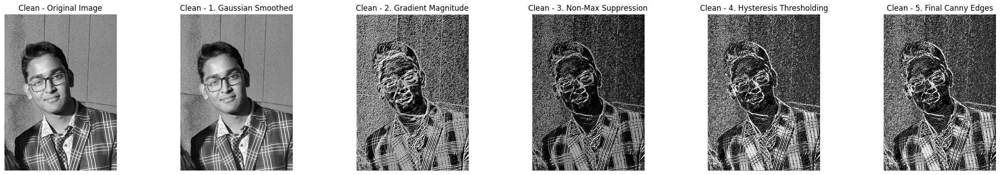

NOISY IMAGE PROCESSING STEPS:


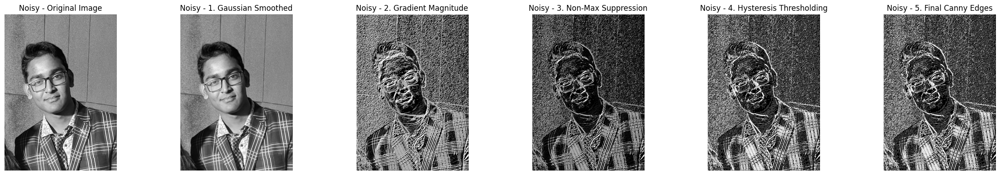

In [ ]:
# Display complete step-by-step visualization for both clean and noisy images
print("COMPLETE STEP-BY-STEP CANNY ALGORITHM VISUALIZATION")

# Display clean image processing steps
print("CLEAN IMAGE PROCESSING STEPS:")
display_canny_steps_complete(grayscale_image, smoothed_clean_complete, magnitude_clean_complete,
                           suppressed_clean_complete, hysteresis_clean, canny_clean_complete, "Clean - ")

# Display noisy image processing steps
print("NOISY IMAGE PROCESSING STEPS:")
display_canny_steps_complete(noisy_grayscale, smoothed_noisy_complete, magnitude_noisy_complete,
                           suppressed_noisy_complete, hysteresis_noisy, canny_noisy_complete, "Noisy - ")
